# Импорт модулей

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
%matplotlib inline
#!pip install MulticoreTSNE

#  *Загрузка dataset*

In [18]:
data = pd.read_csv('creditcard.csv').sample(10000)

In [19]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
81047,58768.0,0.871501,-0.088083,-0.012256,1.245949,-0.237383,-1.007759,0.748393,-0.368838,-0.333438,...,-0.264008,-1.196715,-0.034735,0.362230,0.354082,-0.768160,-0.028084,0.059897,200.33,0
251186,155263.0,1.971606,-1.221274,-0.434318,-0.716836,-1.319130,-0.775182,-0.852908,-0.128739,0.102420,...,0.015222,-0.147795,0.315672,-0.041315,-0.554199,-0.491076,-0.002694,-0.024985,102.47,0
246465,153183.0,-0.131563,-0.376277,-1.581778,-1.777892,0.700427,-0.804857,2.698591,-0.868415,-1.778918,...,0.156356,0.683128,0.386302,0.512630,-0.312676,0.668692,-0.133938,0.019122,289.25,0
168609,119305.0,-0.573306,-1.820594,1.821042,-2.502259,-0.215472,1.136643,-0.529716,-0.266437,-0.705316,...,-0.120963,0.921528,0.370417,-1.059277,-1.423005,-0.363186,-0.372325,-0.355619,78.00,0
195829,131238.0,-1.991851,-1.245559,0.592136,-3.108989,0.069898,0.385119,-0.634879,0.594820,-2.379455,...,-0.159921,-0.117458,0.075802,-0.360919,0.939273,-0.100669,0.106388,-0.038884,95.50,0


Набор данных состоит из 28 анонимизированных переменных, 1 переменной "amount", 1 переменной "time" и 1 целевой переменной - Class

In [20]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000
mean,94286.02270,-0.002271,0.014534,0.007936,0.002618,0.021857,0.008300,0.008218,0.016305,-0.013718,...,-0.000761,-0.004495,-0.009728,0.003102,-0.001544,-0.001108,0.005083,0.005447,85.20095,0.00210
std,47315.20184,1.951360,1.646423,1.481620,1.439103,1.323268,1.332843,1.166138,1.013482,1.104424,...,0.612125,0.713537,0.683031,0.603751,0.531530,0.480575,0.403624,0.390996,232.59781,0.04578
min,9.00000,-34.092032,-38.694338,-18.043109,-5.266509,-25.772800,-9.674221,-21.922811,-18.601088,-6.912076,...,-7.012034,-4.328383,-22.575000,-2.721546,-4.781606,-1.581931,-7.057087,-7.047939,0.00000,0.00000
25%,53695.00000,-0.900402,-0.583579,-0.882193,-0.847137,-0.664901,-0.774468,-0.538622,-0.213492,-0.667320,...,-0.231474,-0.539747,-0.161716,-0.354736,-0.320341,-0.326721,-0.069354,-0.052578,5.48000,0.00000
50%,83701.50000,0.001043,0.075591,0.194899,-0.022740,-0.039283,-0.270317,0.033025,0.022445,-0.069984,...,-0.031027,-0.000103,-0.011483,0.041487,0.019835,-0.052315,0.004458,0.012689,22.28500,0.00000
75%,138512.00000,1.299760,0.798069,1.039285,0.757954,0.651792,0.408958,0.574204,0.328755,0.581629,...,0.184636,0.518631,0.143656,0.441470,0.352342,0.244637,0.102060,0.082335,75.00000,0.00000
max,172785.00000,2.420346,12.730564,3.621715,13.143668,13.926946,15.496962,21.914529,10.713656,8.433788,...,11.714914,2.550605,9.506373,3.962197,3.119632,2.733698,9.200883,15.619041,8787.00000,1.00000


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 81047 to 39497
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    10000 non-null  float64
 1   V1      10000 non-null  float64
 2   V2      10000 non-null  float64
 3   V3      10000 non-null  float64
 4   V4      10000 non-null  float64
 5   V5      10000 non-null  float64
 6   V6      10000 non-null  float64
 7   V7      10000 non-null  float64
 8   V8      10000 non-null  float64
 9   V9      10000 non-null  float64
 10  V10     10000 non-null  float64
 11  V11     10000 non-null  float64
 12  V12     10000 non-null  float64
 13  V13     10000 non-null  float64
 14  V14     10000 non-null  float64
 15  V15     10000 non-null  float64
 16  V16     10000 non-null  float64
 17  V17     10000 non-null  float64
 18  V18     10000 non-null  float64
 19  V19     10000 non-null  float64
 20  V20     10000 non-null  float64
 21  V21     10000 non-null  float64

Датасет состоит из 28 анонимизированных переменных, 1 переменной "amount", 1 переменной "time" и 1 целевой переменной - Class.

In [22]:
data.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

### Распределение цели

In [149]:
vc = data['Class'].value_counts().to_frame().reset_index()
vc['percent'] = vc["Class"].apply(lambda x : round(100*float(x) / len(data), 2))
vc = vc.rename(columns = {"index" : "Target", "Class" : "Count"})
vc

,Target,Count,percent
0,0,9979,99.79
1,1,21,0.21


В данном датасете только 0,21% случаев являются мошенническими транзакциями. Можно сказать это проблема, так как  сама цель очень несбалансирована.

In [32]:
data.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

## 1. EDA

### Построим распределение

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f3b85391b00>,
      dtype=object)

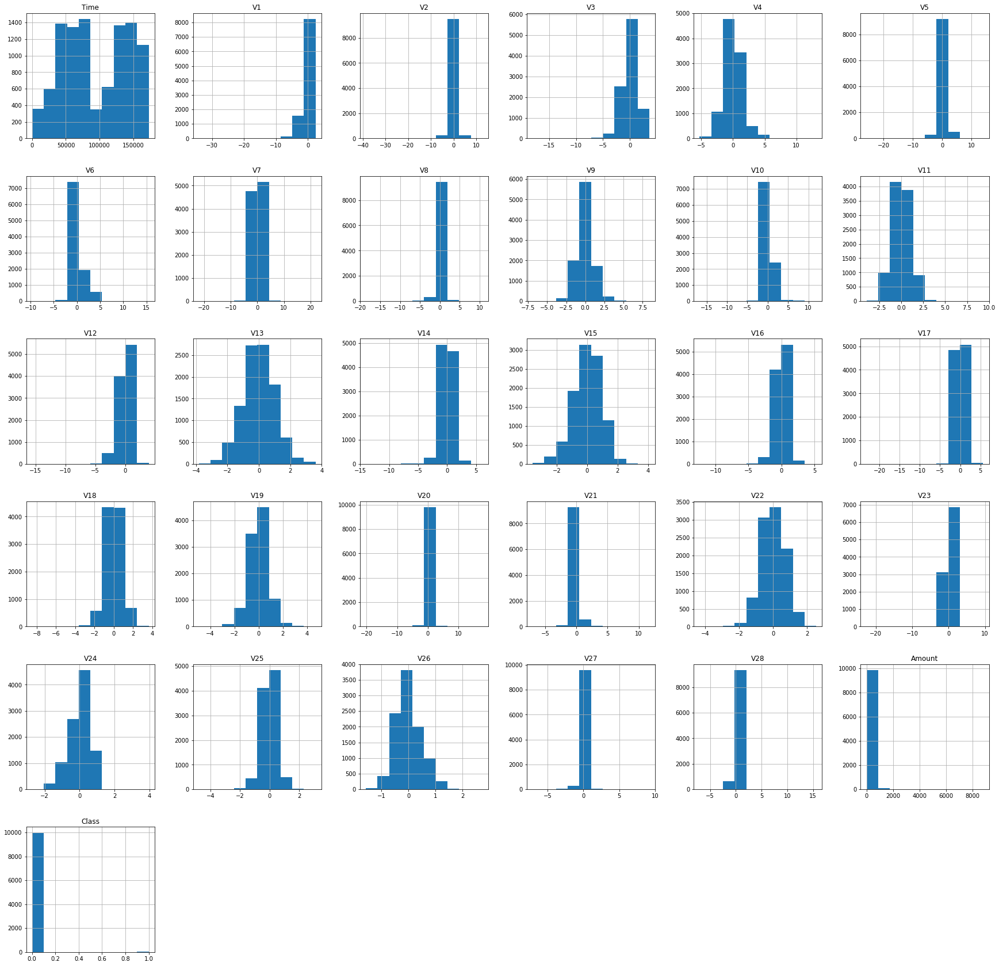

In [25]:
data.hist(figsize=(30,30))

### Посмотрим на корреляцию данных

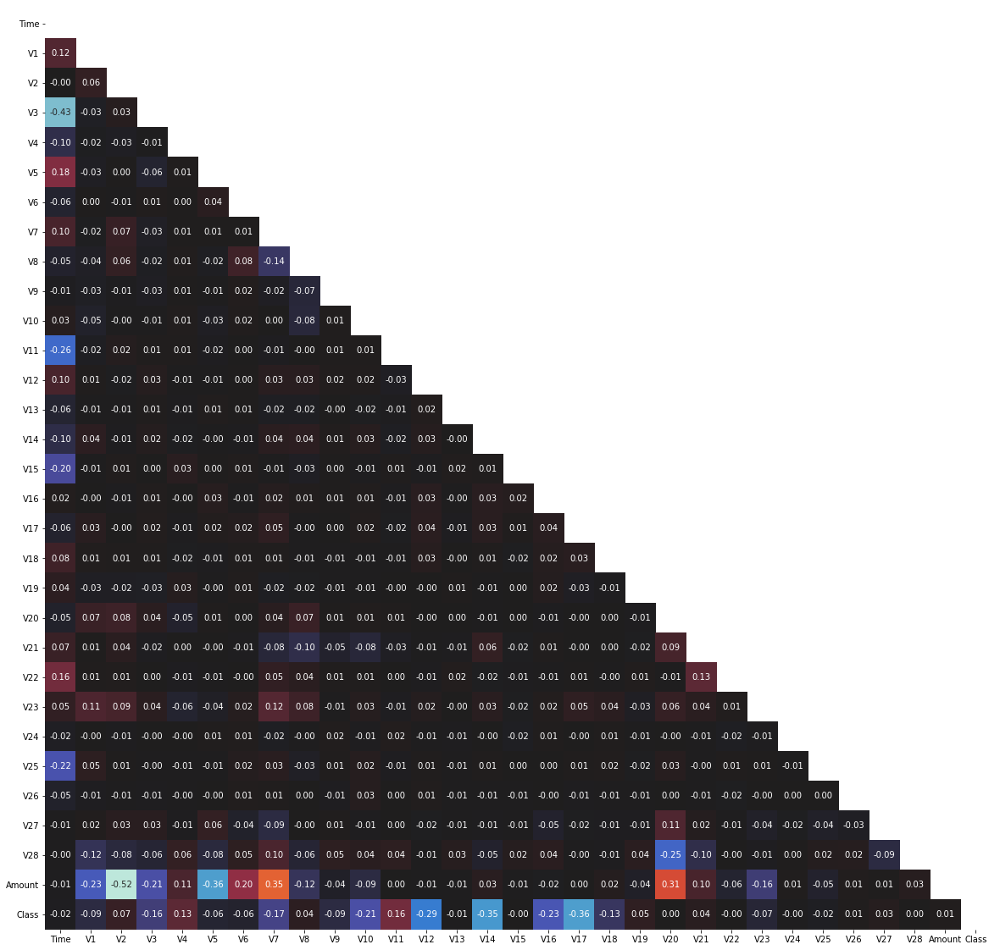

In [26]:
plt.figure(figsize=(20,20))

corr_matrix = data.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(np.bool))

sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0);

### Распределение признаков

In [27]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.1)|(lower[column] < -0.4))
]
high_corr

['Time', 'V1', 'V2', 'V4', 'V6', 'V7', 'V11', 'V20', 'V21']

In [28]:
other_features = [col for col in data.columns if col not in high_corr and col!='quality']

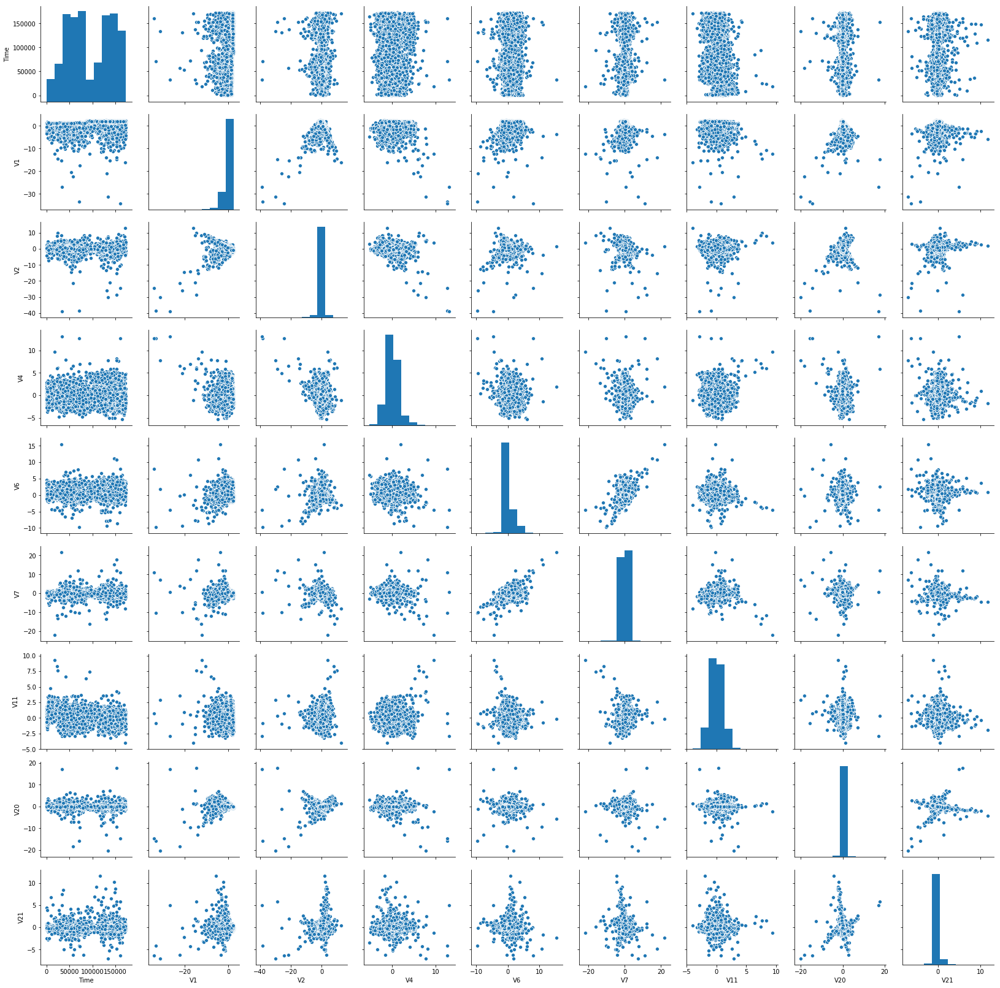

In [29]:
sns.pairplot(data[high_corr]);

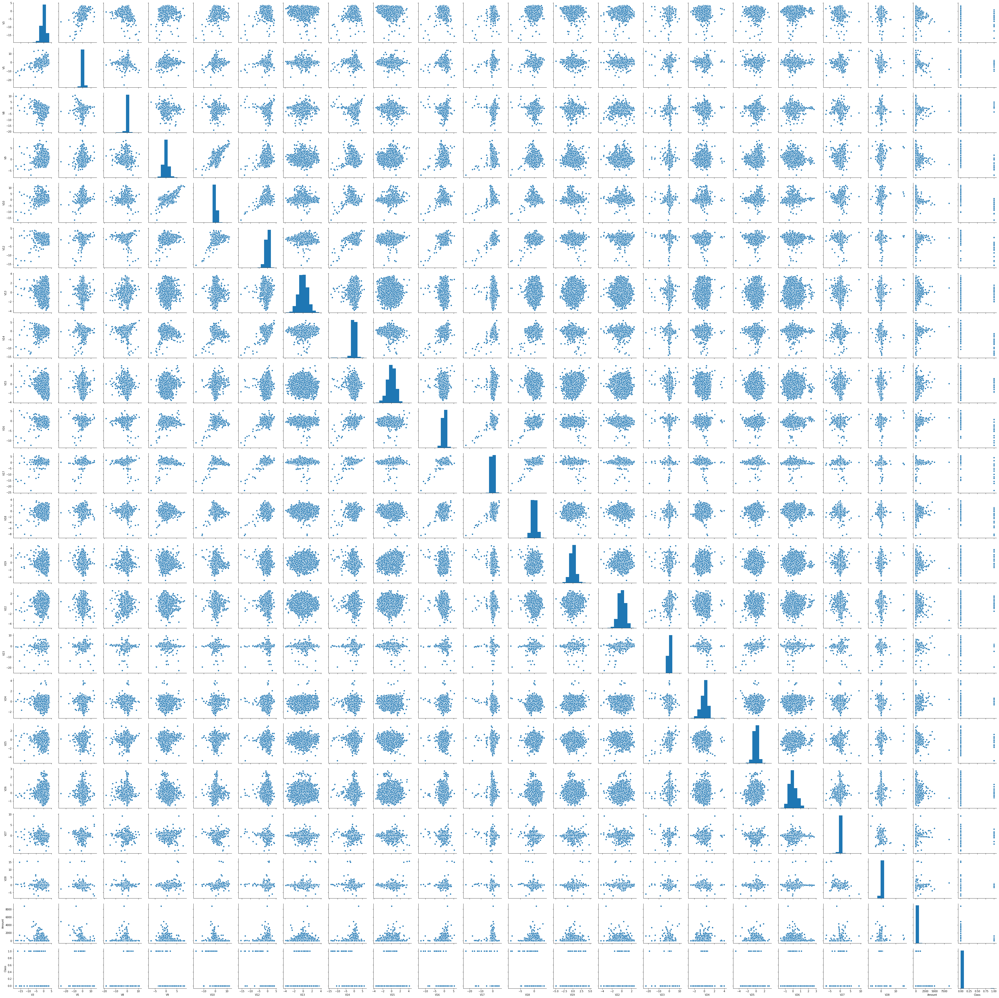

In [30]:
sns.pairplot(data[other_features]);

In [31]:
import plotly.offline as py
import plotly.graph_objs as go

py.init_notebook_mode(connected=True)

from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import TSNE


from fastprogress import master_bar, progress_bar
from IPython.display import display

In [33]:
def plot_scatter(X, y, mode='TSNE', fname='file.png'):
    X_r = TSNE(n_components=2, random_state=42).fit_transform(X)    

    traces = []
    traces.append(go.Scatter(x=X_r[y == 0, 0], y=X_r[y == 0, 1], mode='markers', showlegend=True, name='Non Fraud'))
    traces.append(go.Scatter(x=X_r[y == 1, 0], y=X_r[y == 1, 1], mode='markers', showlegend=True, name='Fraud'))

    layout = dict(title=f'{mode} plot')
    fig = go.Figure(data=traces, layout=layout)
    py.iplot(fig, filename=fname)

In [34]:
fraud = data.loc[data['Class'] == 1]
non_fraud = data.loc[data['Class'] == 0].sample(100)

x = pd.concat([fraud, non_fraud]).sample(frac=1.).reset_index(drop=True)
y = x.pop('Class')
    


In [35]:
plot_scatter(x,y)

Из приведенного выше графика мы можем заметить, что существует много Non Fraud транзакций, которые очень близки к мошенническим транзакциям, поэтому их трудно точно классифицировать по модели.

### Метод 3-сигм

In [60]:
def outlier_std(data, col, threshold=3):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [92]:
def get_column_outliers(data, columns=None, function=outlier_std, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns
        
    outliers = pd.Series(data=[False]*len(data), index=data_features.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True
    
    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    comparison_table = comparison_table.sort_values(by='anomalies_percentage', ascending=False)
    
    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), round(sum(outliers)/len(outliers),2)))   

Подсчитаем процент аномалий,по переменной Class (можно сказать она и является таргетом)

In [93]:
data_features = data.iloc[:, :-1]

In [94]:
comparison_table, std_outliers = get_column_outliers(data_features)
anomalies_report(std_outliers)

Total number of outliers: 1346
Percentage of outliers:   0.13%


Посмотрим по каждой колонке

In [95]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
V8,3.056751,-3.024140,178.0,1.78
V27,1.215954,-1.205789,174.0,1.74
V6,4.006829,-3.990228,171.0,1.71
Amount,782.994379,-612.592479,167.0,1.67
V21,1.835615,-1.837137,158.0,1.58
V20,2.317504,-2.341572,146.0,1.46
V2,4.953802,-4.924735,141.0,1.41
V1,5.851808,-5.856350,131.0,1.31
V14,2.949656,-2.973862,130.0,1.30
V7,3.506633,-3.490197,124.0,1.24


Метод межквартильного отклонения

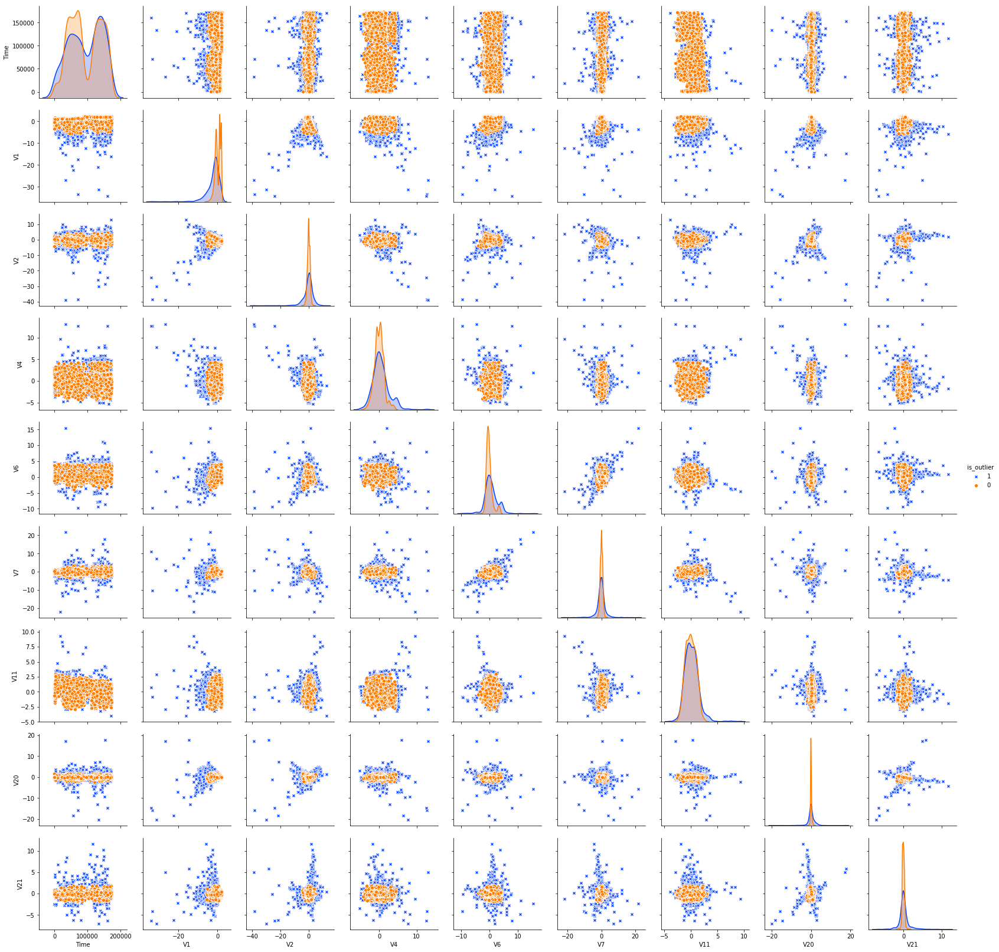

In [96]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

Подсчитаем характеристики

IndexError: index 2 is out of bounds for axis 0 with size 2

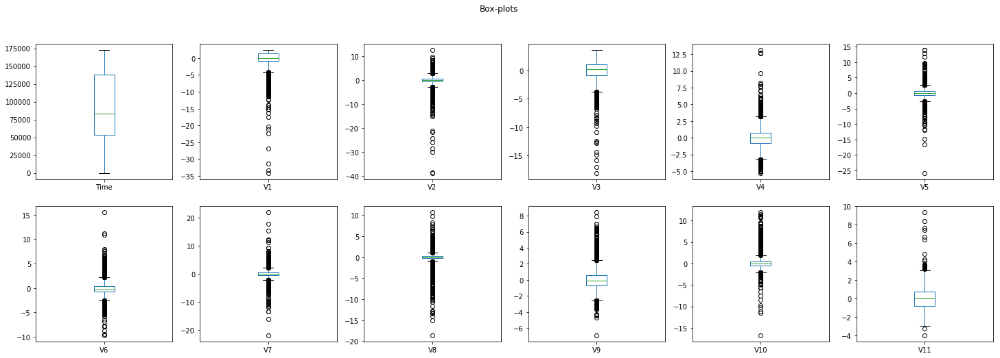

In [97]:
fig, axes = plt.subplots(2, 6, figsize=(25, 8))
fig.suptitle('Box-plots')

row=0
col=0

for ax, feature in enumerate(data_features):
    data_features[feature].plot.box(ax=axes[row, col])
    col+=1
    if col > 5:
        row+=1
        col=0

In [98]:
def outlier_iqr(data, col, threshold=3):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col]>up_bound,data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [99]:
comparison_table, iqr_outliers = get_column_outliers(data_features, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 1801
Percentage of outliers:   0.18%


In [100]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
Amount,283.560000,-203.080000,628.0,6.28
V27,0.616304,-0.583598,530.0,5.30
V20,1.153619,-1.234520,443.0,4.43
V28,0.487076,-0.457319,427.0,4.27
V8,1.955498,-1.840235,398.0,3.98
V23,1.059771,-1.077831,306.0,3.06
V21,1.432966,-1.479803,235.0,2.35
V6,3.959236,-4.324746,181.0,1.81
V2,4.943013,-4.728523,147.0,1.47
V10,3.437944,-3.514980,117.0,1.17


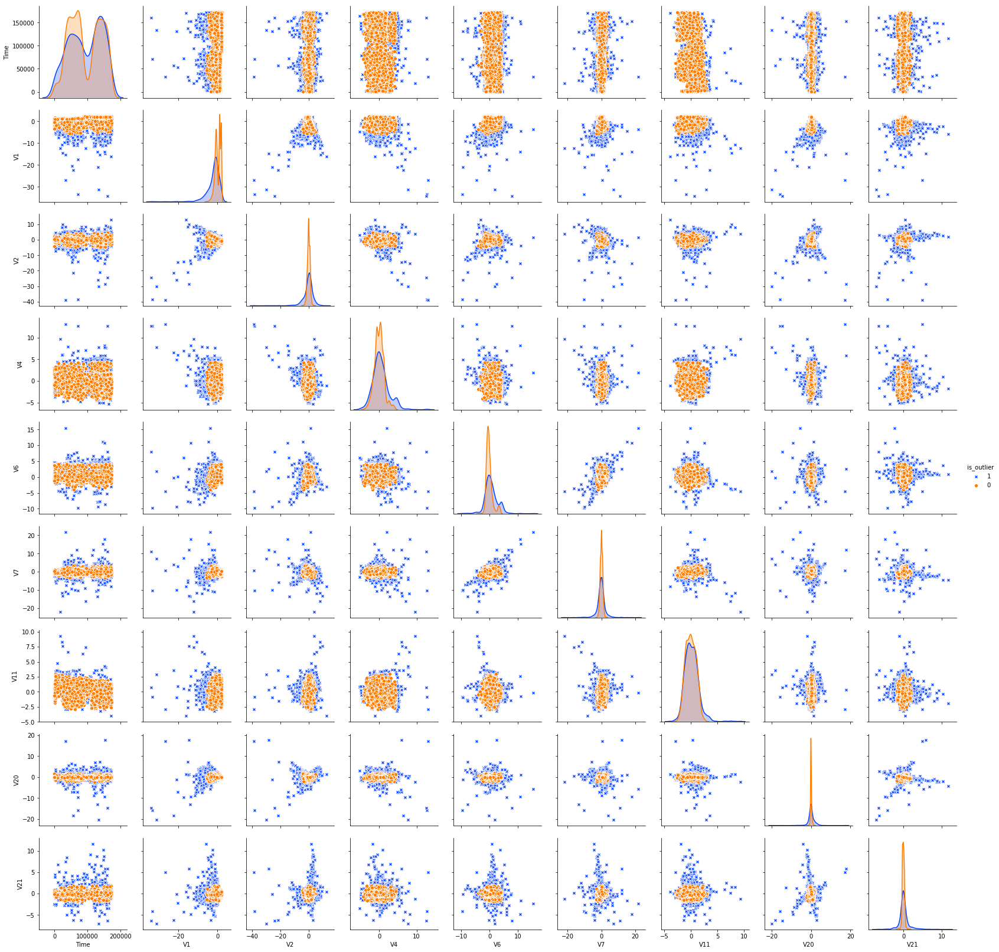

In [101]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

### Метод Кластеризации 

In [102]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    """
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

In [103]:
scaler = RobustScaler()
X_scaled = scaler.fit_transform(data)
data_scaled = pd.DataFrame(X_scaled, columns=data.columns)
columns=data_features.columns
data_scaled.tail()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
9995,-0.146580,0.608095,-0.723083,0.291351,-0.381031,-0.862676,0.378179,-1.025357,0.106939,0.098368,...,0.264350,0.246587,-0.538943,-0.785113,0.692149,-0.151703,0.242739,0.088340,0.408731,0.0
9996,0.458935,0.065117,0.510035,-0.028519,-0.369214,0.460895,-0.684417,0.929121,-0.589499,-0.035619,...,0.906029,1.040179,-0.831657,-0.105446,-0.020836,-0.207622,0.327303,0.188813,-0.167074,0.0
9997,0.896524,-0.707746,1.342916,-0.867395,-0.726261,0.375152,0.313298,0.129932,1.708851,0.121379,...,-0.701748,-0.728959,0.378230,-0.497177,-0.143366,0.396714,2.417346,1.471177,-0.061781,0.0
9998,0.522401,0.971140,-0.585782,-1.207264,-0.503232,-0.129581,-1.257246,0.243571,-1.123488,-0.634338,...,0.997838,0.892409,-0.321925,-0.010597,0.539314,0.228962,-0.571507,-0.625957,0.815808,0.0
9999,-0.516883,-0.108288,0.494463,0.837076,0.625813,0.173837,0.403595,0.530794,0.039448,-0.257128,...,-0.050295,0.096583,-0.065980,0.186944,-0.937905,-0.835526,0.156906,-0.595176,-0.214111,0.0


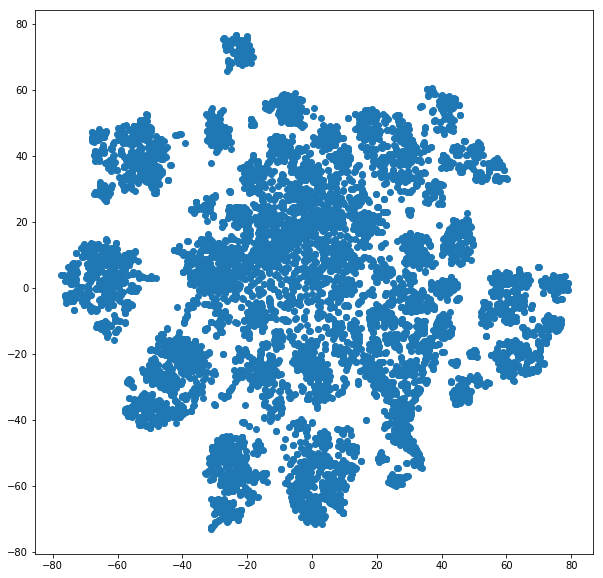

In [104]:
tsne = TSNE(perplexity=50, n_jobs=-1)
tsne_transformed = tsne.fit_transform(data_scaled)

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1]);

In [105]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=90)
euclidian_model.fit(data_scaled)
euclidian_outliers = euclidian_model.predict(data_scaled)
anomalies_report(euclidian_outliers)

Total number of outliers: 1000
Percentage of outliers:   0.10%


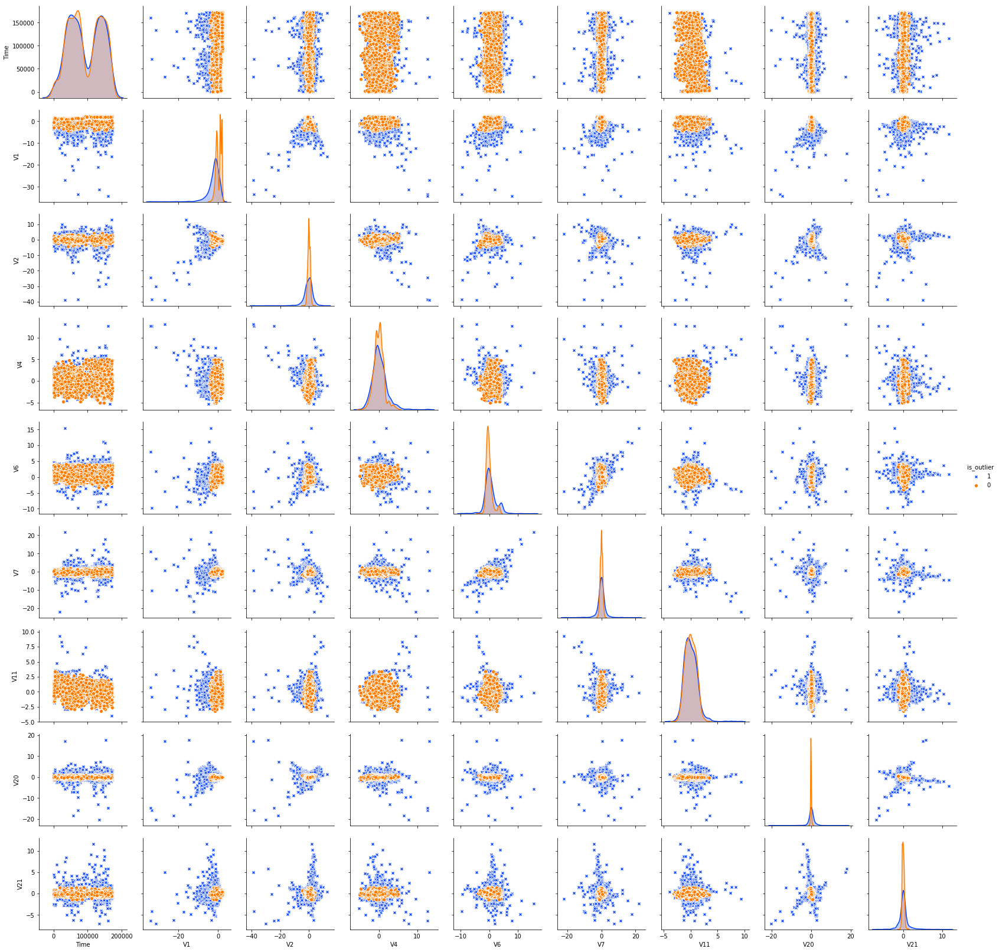

In [106]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = iqr_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

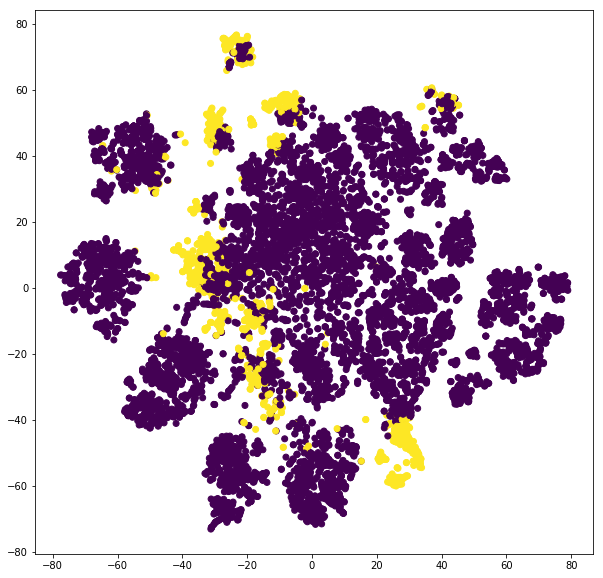

In [107]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

In [108]:
citiblock_model = DistanceOutliers(metric='cityblock', percentile=90)
citiblock_model.fit(data_scaled)
cityblock_outliers = citiblock_model.predict(data_scaled)
anomalies_report(cityblock_outliers)

labeled_data = data_features.copy()
labeled_data['is_outlier'] = cityblock_outliers

Total number of outliers: 1000
Percentage of outliers:   0.10%


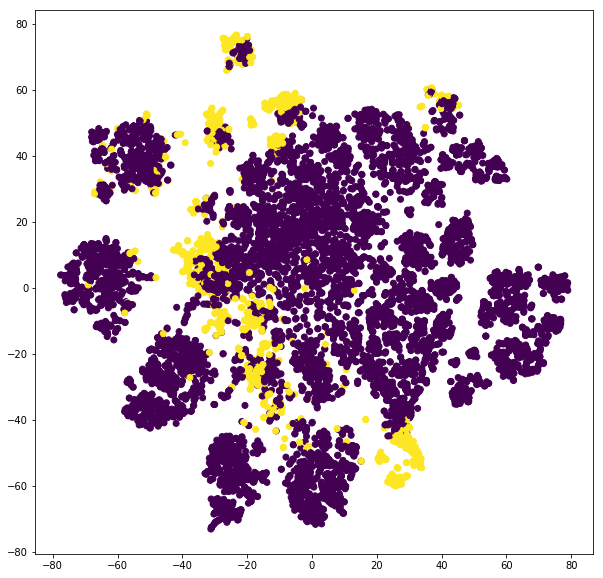

In [109]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=cityblock_outliers);

## One-Class SVM

In [110]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.10, gamma='auto')
one_class_svm.fit(data_scaled)
svm_outliers = one_class_svm.predict(data_scaled)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [111]:
anomalies_report(svm_outliers)

Total number of outliers: 1004
Percentage of outliers:   0.10%


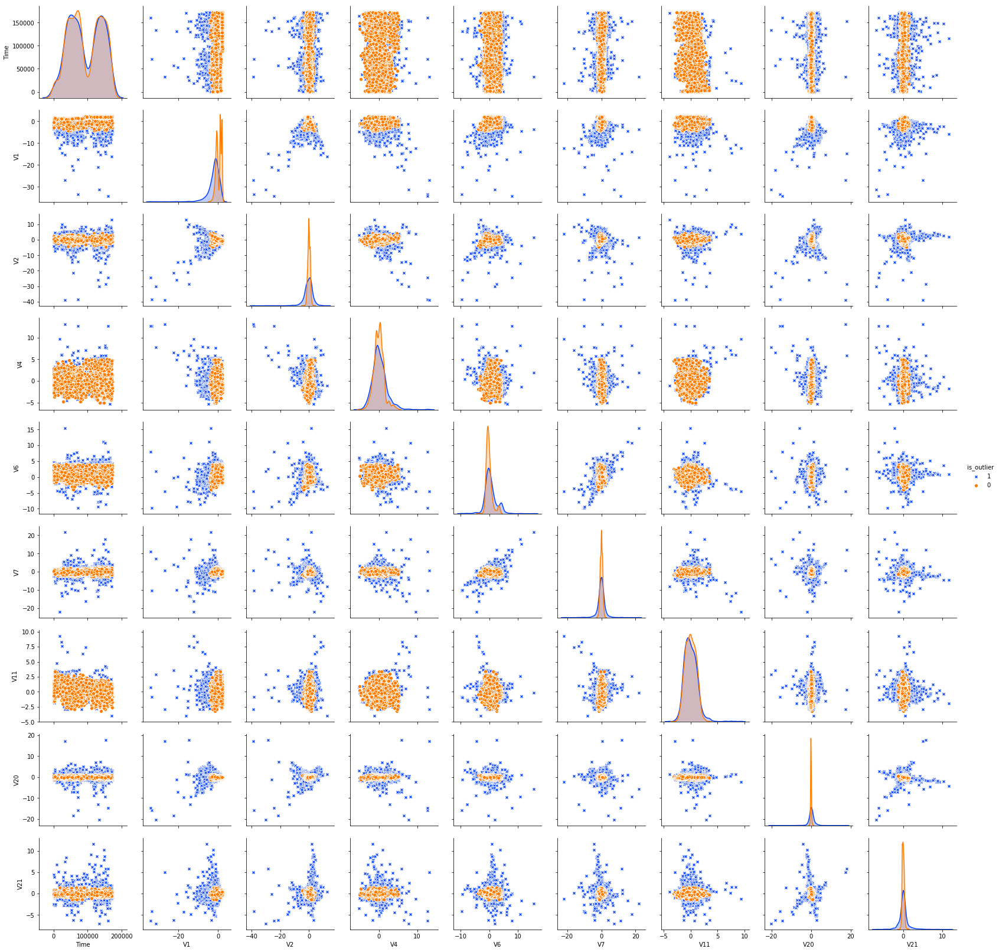

In [112]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = iqr_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

### DBSCAN

In [113]:
from sklearn.cluster import DBSCAN

# для начала считаем все наблюдения аномальными
outlier_percentage = 1.

num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.05
eps_history = [eps]
while outlier_percentage>0.1:    
    model = DBSCAN(eps=eps).fit(data_scaled)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # считаем текущий процент "шума"
    outlier_percentage = sum(labels==1) / len(labels)    
    eps += 0.05
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)
    
model = DBSCAN(eps)
model.fit(data_scaled)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [114]:
anomalies_report(density_outlier)

Total number of outliers: 951
Percentage of outliers:   0.10%


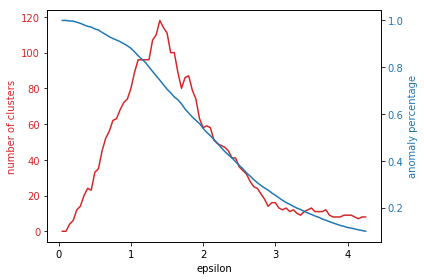

In [115]:
iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('epsilon')
ax1.set_ylabel('number of clusters', color=color)
ax1.plot(iterations, num_clusters, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  

color = 'tab:blue'
ax2.set_ylabel('anomaly percentage', color=color)  
ax2.plot(iterations, anomaly_percentage, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  
plt.show()

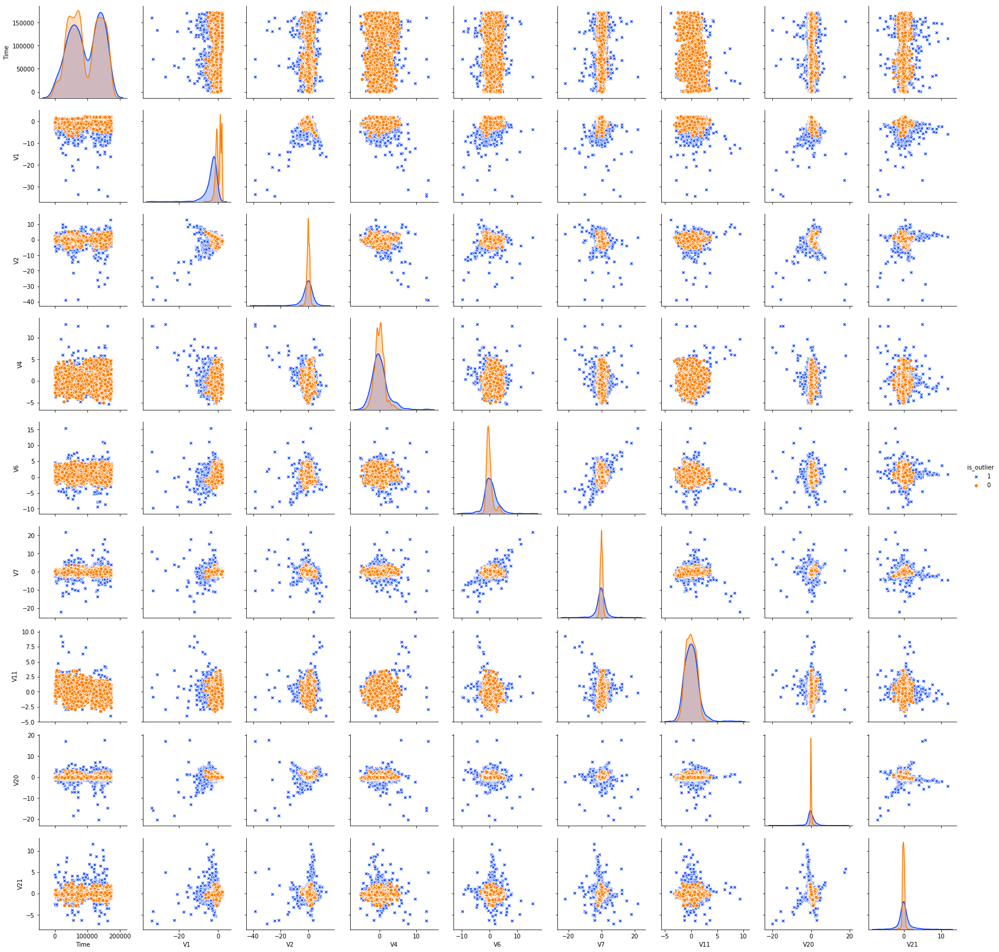

In [116]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outlier

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

Подсчитаем процент аномалий,по переменной Class (можно сказать она и является таргетом)

### Isolation Forest

In [117]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, contamination=0.1, 
                                   max_features=1.0, bootstrap=True)
isolation_forest.fit(data_scaled)

isolation_outliers = isolation_forest.predict(data_scaled)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

In [118]:
anomalies_report(isolation_outliers)

Total number of outliers: 1000
Percentage of outliers:   0.10%


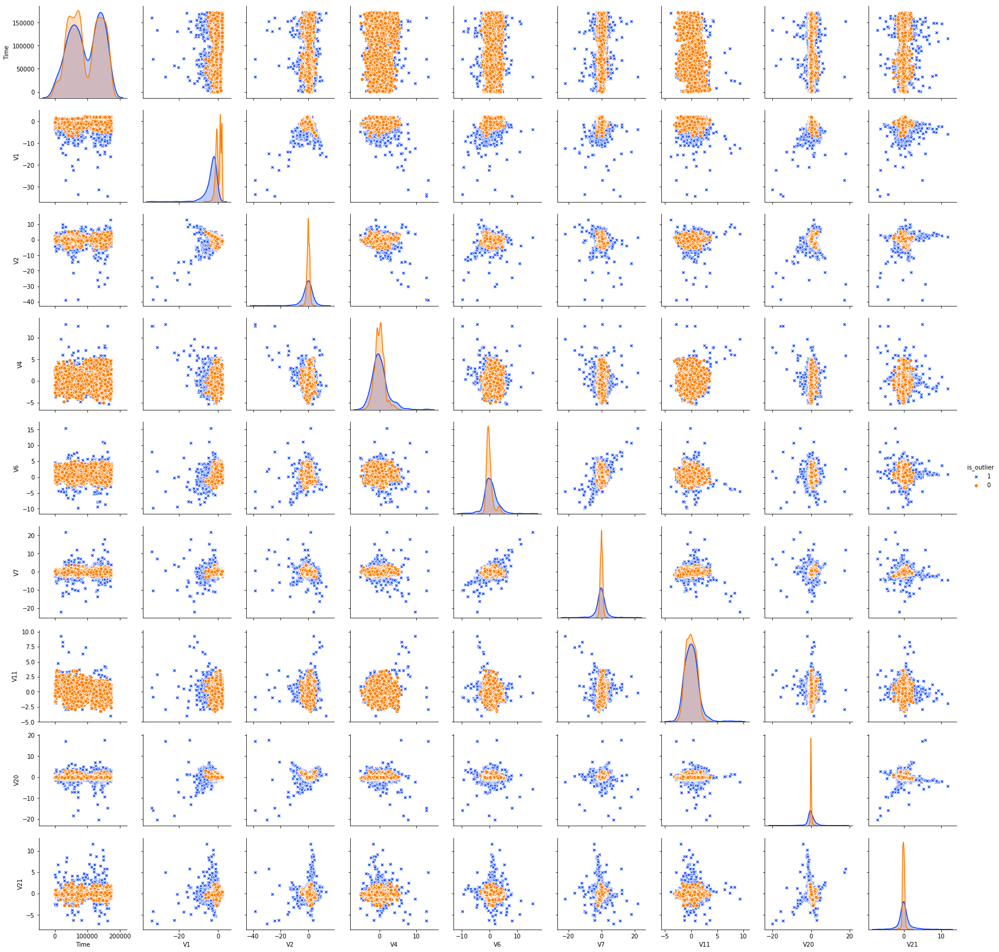

In [119]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outlier

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

In [120]:
summary = np.concatenate((
    [std_outliers], 
    [iqr_outliers], 
    [euclidian_outliers], 
    [cityblock_outliers],
    [density_outlier],
    [svm_outliers],
    [isolation_outliers]
))

In [121]:
summary = pd.DataFrame(
    summary.T, 
    columns=['std', 'iqr', 'euclid', 'cityblock', 'dbscan', 'svm', 'isolation']
)
summary.head()

,std,iqr,euclid,cityblock,dbscan,svm,isolation
0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0
3,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0


In [122]:
summary.sum(axis=1).value_counts()

0    7696
1     827
7     533
2     344
6     223
5     144
3     134
4      99
dtype: int64

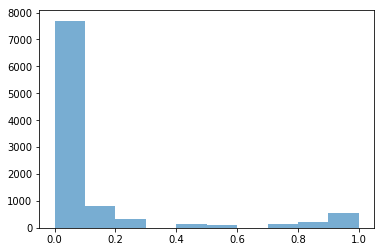

In [123]:
outlier_score = summary.mean(axis=1)
plt.hist(outlier_score, alpha=0.6);

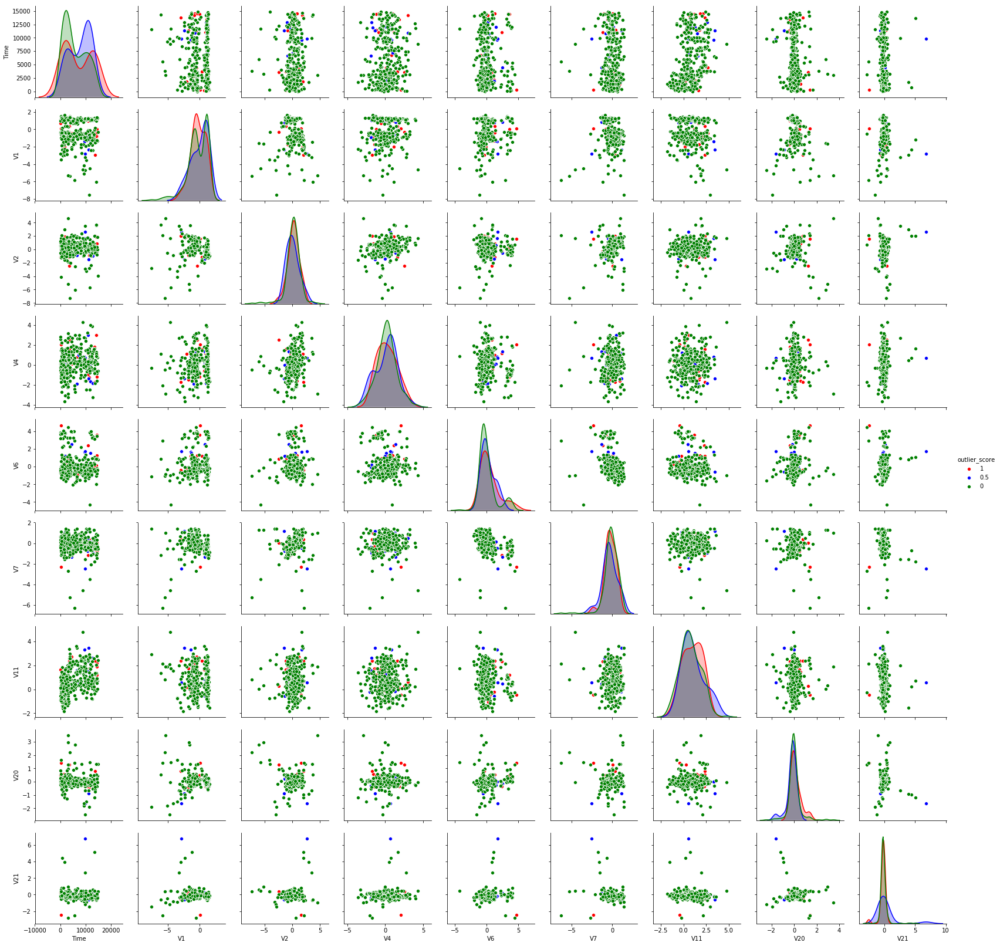

In [124]:
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 0.5 if x < 0.8 else 1)

labeled_data = data_features.copy()
labeled_data['outlier_score'] = simple_score

custom_palette = {0:'g', 0.5:'b', 1.0:'r'}

sns.pairplot(data=labeled_data, vars=high_corr, 
             hue='outlier_score',
             hue_order=[1, 0.5, 0],
             palette=custom_palette
)

### Построение модели

In [125]:
from sklearn.linear_model import LogisticRegression

In [142]:
features = pd.concat([data.loc[:,'V1':'Amount'],data.loc[:,'Time']],axis=1)
target = data['Class']

x_train,x_test,y_train,y_test = train_test_split(features,target, stratify=target,test_size=0.35, random_state=1)

print('y_train class counts')
print(y_train.value_counts())
print('')
print('y_test class counts')
print(y_test.value_counts())


# Хранение
y_test_notfraud = y_test.value_counts()[0]
y_test_fraud = y_test.value_counts()[1]

print ("")
print ("Accuracy Score: ", accuracy_score(y_test, pred_y))

y_train class counts
0    6486
1      14
Name: Class, dtype: int64

y_test class counts
0    3493
1       7
Name: Class, dtype: int64

Accuracy Score:  0.9968571428571429


In [143]:
lr_model = LogisticRegression()
lr_model.fit(x_train,y_train)

pred = lr_model.predict(x_test)


/home/baki/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



/home/baki/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



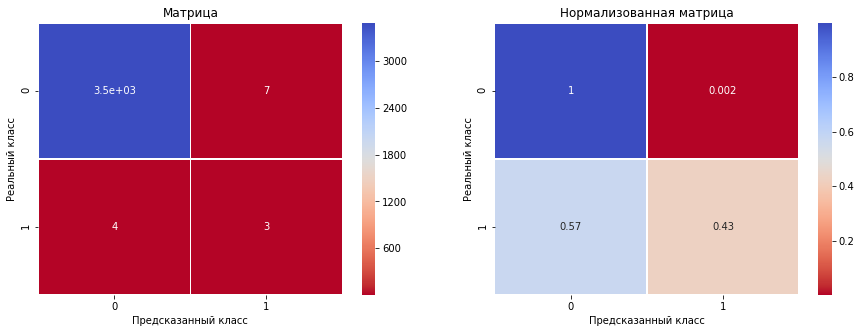

---Классификационный отчет---
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3493
           1       0.30      0.43      0.35         7

    accuracy                           1.00      3500
   macro avg       0.65      0.71      0.68      3500
weighted avg       1.00      1.00      1.00      3500


Accuracy Score:  0.9968571428571429


In [144]:
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,auc,precision_recall_curve,roc_curve
def PlotConfusionMatrix(y_test,pred,y_test_legit,y_test_fraud):

    cfn_matrix = confusion_matrix(y_test,pred)
    cfn_norm_matrix = np.array([[1.0 / y_test_legit,1.0/y_test_legit],[1.0/y_test_fraud,1.0/y_test_fraud]])
    norm_cfn_matrix = cfn_matrix * cfn_norm_matrix

    fig = plt.figure(figsize=(15,5))
    ax = fig.add_subplot(1,2,1)
    sns.heatmap(cfn_matrix,cmap='coolwarm_r',linewidths=0.5,annot=True,ax=ax)
    plt.title('Матрица')
    plt.ylabel('Реальный класс')
    plt.xlabel('Предсказанный класс')

    clf = LogisticRegression(solver="lbfgs").fit(x_train, y_train)
    pred_y = clf.predict(x_test)
    
    ax = fig.add_subplot(1,2,2)
    sns.heatmap(norm_cfn_matrix,cmap='coolwarm_r',linewidths=0.5,annot=True,ax=ax)

    plt.title('Нормализованная матрица')
    plt.ylabel('Реальный класс')
    plt.xlabel('Предсказанный класс')
    plt.show()
    
    print('---Классификационный отчет---')
    print(classification_report(y_test,pred))
    
    print ("")
    print ("Accuracy Score: ", accuracy_score(y_test, pred_y))
PlotConfusionMatrix(y_test,pred,y_test_notfraud,y_test_fraud)

Классификационный отчет для точности оценки каждого класса.  Наш истинный положительный показатель составляет 0,4, что не слишком плохо.Нормализованная матрица  показывает более  точную информацию. 

### Устранение дисбаланса классов

/home/baki/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/baki/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



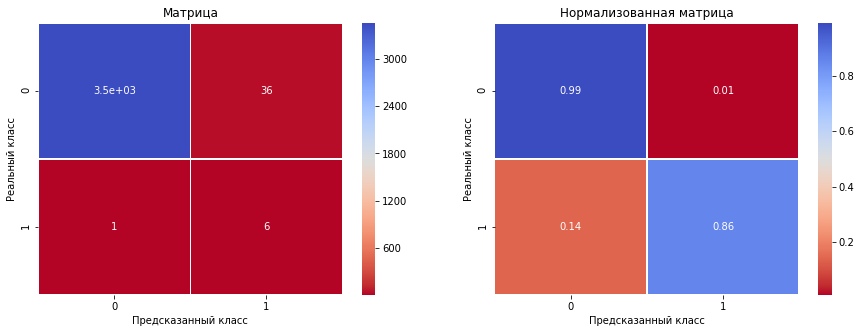

---Классификационный отчет---
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      3493
           1       0.14      0.86      0.24         7

    accuracy                           0.99      3500
   macro avg       0.57      0.92      0.62      3500
weighted avg       1.00      0.99      0.99      3500


Accuracy Score:  0.9968571428571429


In [148]:
lr_model = LogisticRegression(class_weight='balanced')
lr_model.fit(x_train,y_train)

pred = lr_model.predict(x_test)

PlotConfusionMatrix(y_test,pred,y_test_notfraud,y_test_fraud)



Теперь классификатор чувствует себя лучше  99% истинно отрицательных показателей и 86% истинно положительных показателей. Однако, если мы посмотрим на индивидуальные оценки точности, этот классификатор теперь намного менее точен, чем раньше. Это связано с тем, что мы увеличили наш показатель отзыва о мошенничестве за счет большего количества неправильно классифицированных законных дел. С помощью «сбалансированного» параметра веса мы увеличили количество ложных срабатываний с 2 до 10. 10 по-прежнему является лишь небольшой частью действительно отрицательных случаев (из 3500), поэтому процент, показанный на нормализованной матрице путаницы, все еще относительно невелик и составляет 0,01%. 

/home/baki/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/baki/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/baki/anaconda3/lib/pytho

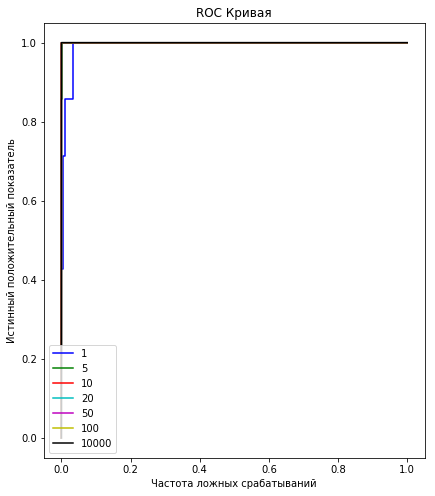

In [156]:
fig = plt.figure(figsize=(15,8))
ax1 = fig.add_subplot(1,2,2)
ax1.set_xlim([-0.05,1.05])
ax1.set_ylim([-0.05,1.05])
ax1.set_xlabel('Частота ложных срабатываний')
ax1.set_ylabel('Истинный положительный показатель')
ax1.set_title('ROC Кривая')

for w,k in zip([1,5,10,20,50,100,10000],'bgrcmykw'):
    lr_model = LogisticRegression(class_weight={0:1,1:w})
    lr_model.fit(x_train,y_train)
    pred_prob = lr_model.predict_proba(x_test)[:,1]

    p,r,_ = precision_recall_curve(y_test,pred_prob)
    tpr,fpr,_ = roc_curve(y_test,pred_prob)
    
    ax1.plot(tpr,fpr,c=k,label=w)
  
    ax1.legend(loc='lower left')

plt.show()



Классификатор нацелен левый верхний угол графика.Синяя линия w = 1 плохо показала себя на графике,а черная линия w = 10000 показала «хорошо». Это связано с высоким дисбалансом класса в данных. Кривая ROC не является хорошей визуальной иллюстрацией для сильно несбалансированных данных, потому что коэффициент ложных срабатываний не падает резко, когда общее количество реальных отрицательных результатов огромно.